Connected to tomato2023 (Python 3.8.10)

In [1]:
import pandas as pd
# import statsmodels.api as sm 
from sklearn.datasets import load_linnerud
# from sklearn.model_selection import train_test_split

In [2]:
from tsai.basics import *
# Load the data
df = pd.read_csv("merged.csv", index_col=0)
X_cols = pd.read_csv("control.csv", index_col=0).columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 13 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(df, fcst_history=fcst_history, 
                                fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                valid_size=valid_size, test_size=test_size)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

KeyError: "None of [Index(['MSRM_DT'], dtype='object')] are in the [columns]"

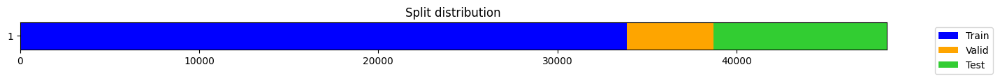

((48384, 49),
 (48384, 1),
 ((#33860) [0,1,2,3,4,5,6,7,8,9...],
  (#4837) [33860,33861,33862,33863,33864,33865,33866,33867,33868,33869...],
  (#9674) [38697,38698,38699,38700,38701,38702,38703,38704,38705,38706...]))

In [3]:
from tsai.basics import *
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 13 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(df, fcst_history=fcst_history, 
                                fcst_horizon=fcst_horizon, datetime_col=datetime_col,
                                valid_size=valid_size, test_size=test_size)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

arch: TSTPlus(c_in=1 c_out=1 seq_len=49 arch_config={} kwargs={'custom_head': functools.partial(<class 'tsai.models.layers.lin_nd_head'>, d=1)})


epoch,train_loss,valid_loss,_rmse,time
0,413.450409,329.093292,18.140930,00:07
1,12.778037,40.510075,6.364752,00:06
2,10.354373,29.800560,5.458989,00:06
3,10.095880,36.970463,6.080334,00:06
4,8.969179,31.269239,5.591891,00:06
5,8.397377,17.441607,4.176315,00:06
6,7.644548,44.261604,6.652939,00:06
7,7.497552,31.594398,5.620889,00:06
8,7.224795,23.361238,4.833346,00:06
9,6.850103,32.036449,5.660075,00:06


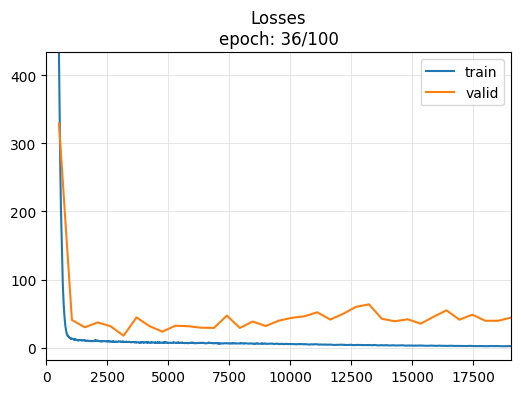

KeyboardInterrupt: 

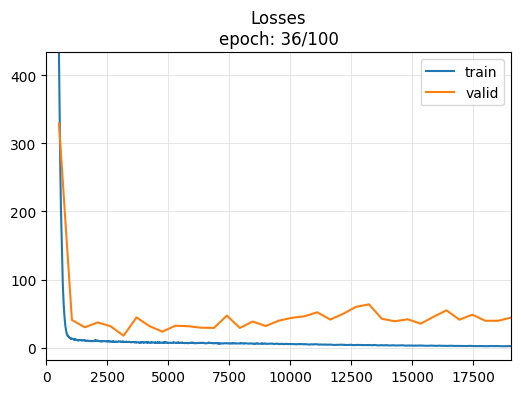

In [4]:
tfms = [None, TSRegression()]
batch_tfms = TSStandardize(by_sample=True)
reg = TSRegressor(X, y, splits=splits, path='models', arch="TSTPlus", tfms=tfms, batch_tfms=batch_tfms, metrics=rmse, cbs=ShowGraph(), verbose=True)
reg.fit_one_cycle(100, 3e-4)
reg.export("reg.pkl")


from tsai.inference import load_learner

reg = load_learner("models/reg.pkl")
raw_preds, target, preds = reg.get_X_preds(X[splits[1]], y[splits[1]])

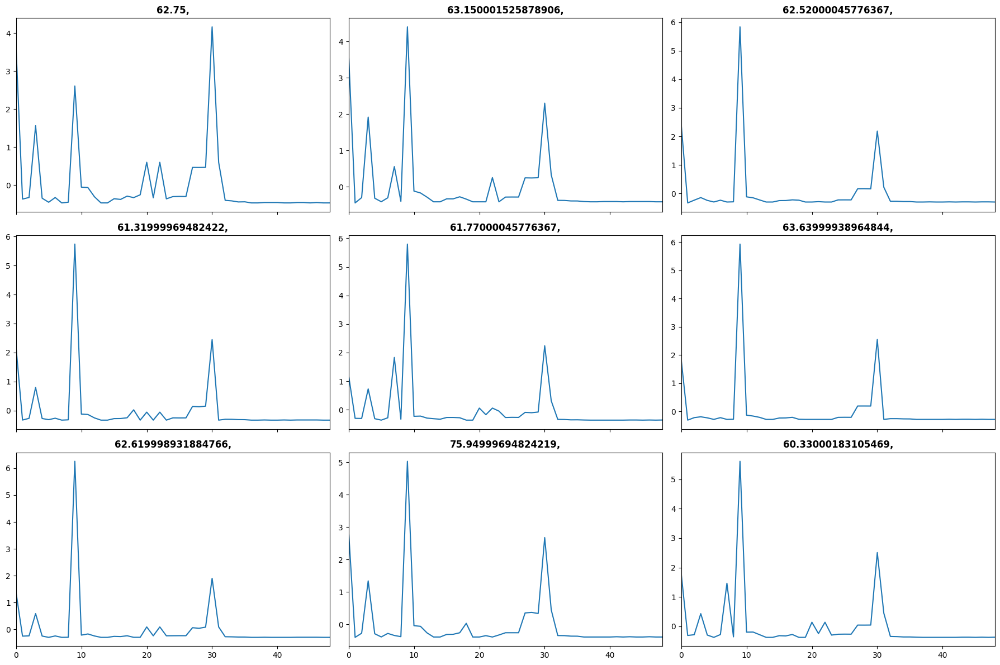

In [5]:
tfms = [None, TSRegression()]
batch_tfms = TSStandardize(by_sample=True)
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, batch_tfms=batch_tfms, bs=128)
# dls.one_batch()
dls.show_batch()

In [6]:
import pandas as pd
from sklearn.datasets import load_linnerud

In [7]:
import pandas as pd
from sklearn.datasets import load_linnerud

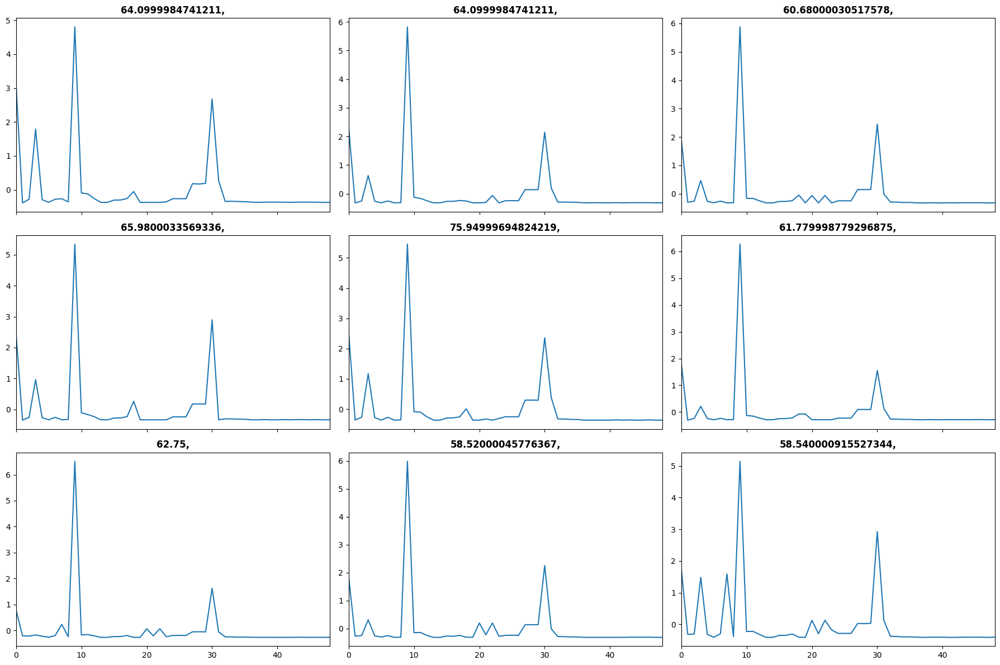

In [8]:
tfms = [None, TSRegression()]
batch_tfms = TSStandardize(by_sample=True)
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [9]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="TSTPlus", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=rmse, cbs=ShowGraph(), verbose=True
)

arch: TSTPlus(c_in=1 c_out=1 seq_len=49 arch_config={} kwargs={'custom_head': functools.partial(<class 'tsai.models.layers.lin_nd_head'>, d=1)})


In [10]:
learn = ts_learner(dls, reg, metrics=[mae, rmse], cbs=ShowGraph())
learn.lr_find()

AttributeError: __name__

SuggestedLRs(valley=0.0002290867705596611)

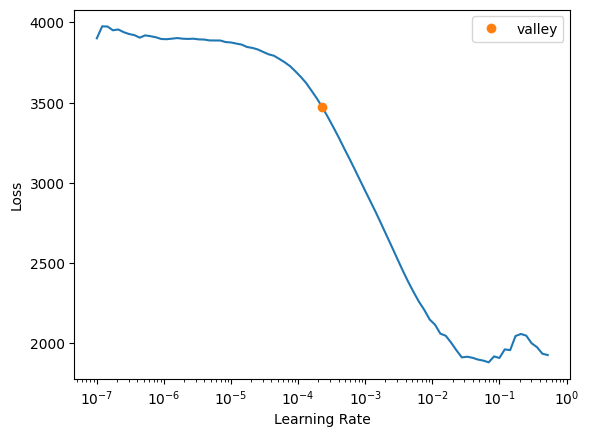

In [11]:
learn = ts_learner(dls, "PatchTST", metrics=[mae, rmse], cbs=ShowGraph())
learn.lr_find()

In [12]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=rmse, cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


SuggestedLRs(valley=0.0002754228771664202)

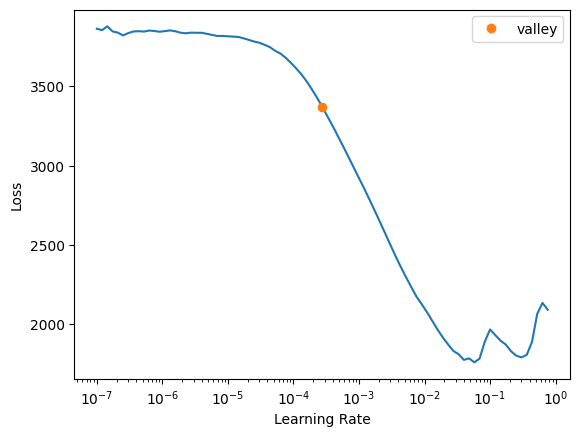

In [13]:
learn = ts_learner(dls, "PatchTST", metrics=[mae, rmse], cbs=ShowGraph())
learn.lr_find()

In [14]:
learn.lr

0.001

In [15]:
learn.loss_func

FlattenedLoss of MSELoss()

In [16]:
learn.lr_find

<bound method Learner.lr_find of <fastai.learner.Learner object at 0x7fc07d3518e0>>

SuggestedLRs(valley=0.0012022644514217973)

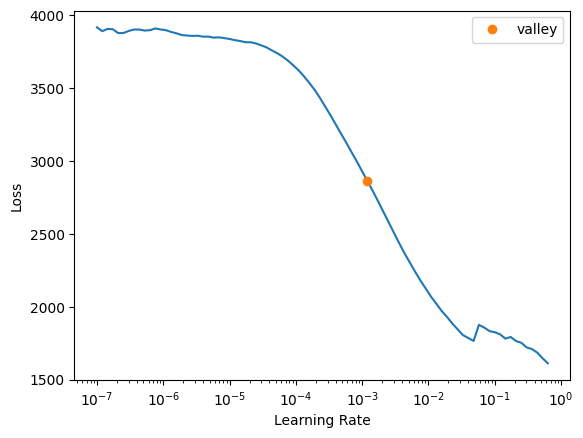

In [17]:
learn.lr_find()

0.0014454397605732083

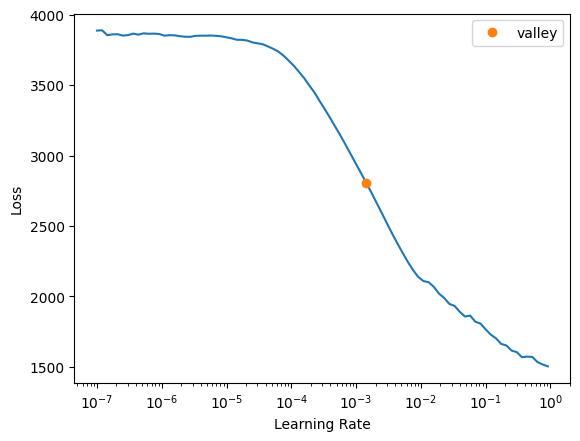

In [18]:
learn.lr_find().valley

float

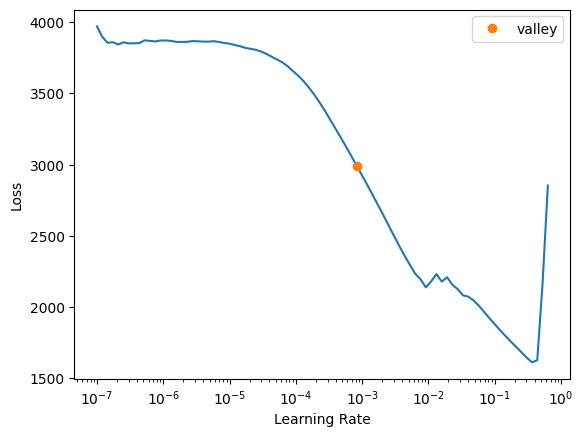

In [19]:
type(learn.lr_find().valley)

In [20]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.basics import *

epochs = 100
# lr = 3e-4

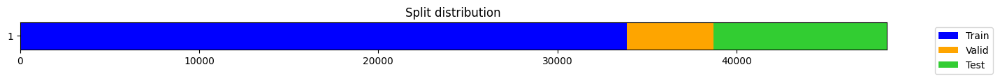

((48384, 49),
 (48384, 1),
 ((#33860) [0,1,2,3,4,5,6,7,8,9...],
  (#4837) [33860,33861,33862,33863,33864,33865,33866,33867,33868,33869...],
  (#9674) [38697,38698,38699,38700,38701,38702,38703,38704,38705,38706...]))

In [21]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 13 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

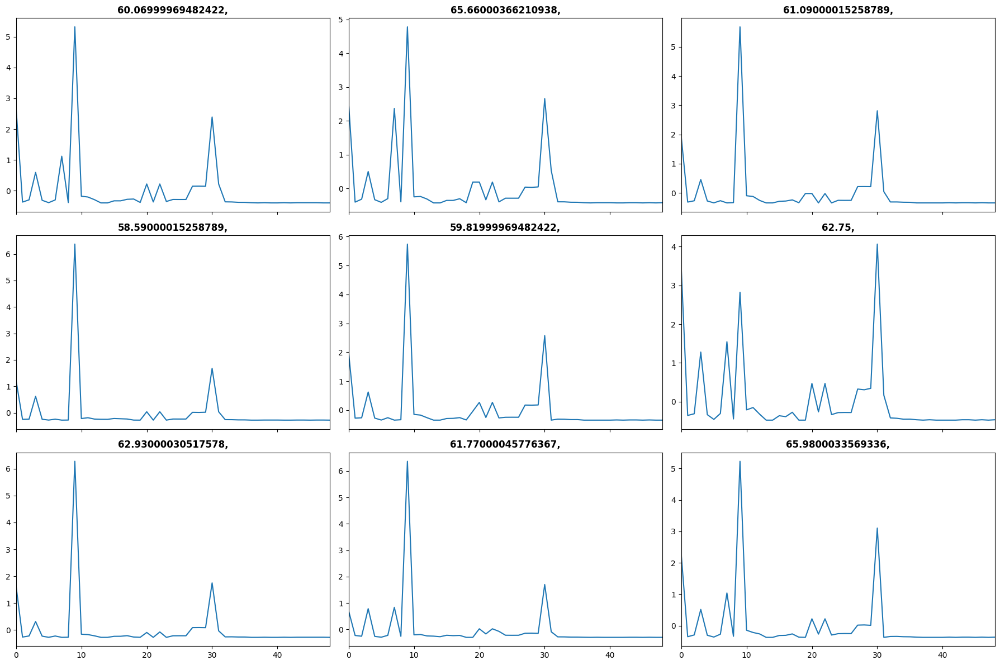

In [22]:
tfms = [None, TSRegression()]
batch_tfms = TSStandardize(by_sample=True)
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [23]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=rmse, cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


epoch,train_loss,valid_loss,_rmse,time
0,11.442668,32.231773,5.677303,00:05
1,9.078244,27.583971,5.252045,00:05
2,8.779972,33.941219,5.825909,00:05
3,8.283229,32.972790,5.742195,00:05
4,8.395129,19.752520,4.444380,00:05
5,8.339413,25.213009,5.021255,00:05
6,8.391142,21.059517,4.589065,00:04
7,8.511646,24.486025,4.948336,00:04
8,8.832017,21.706556,4.659029,00:05
9,8.323247,34.276539,5.854618,00:05


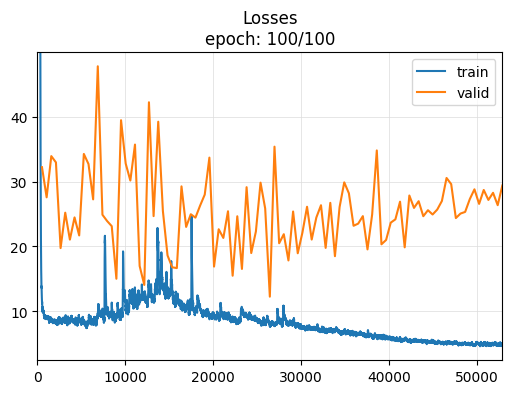

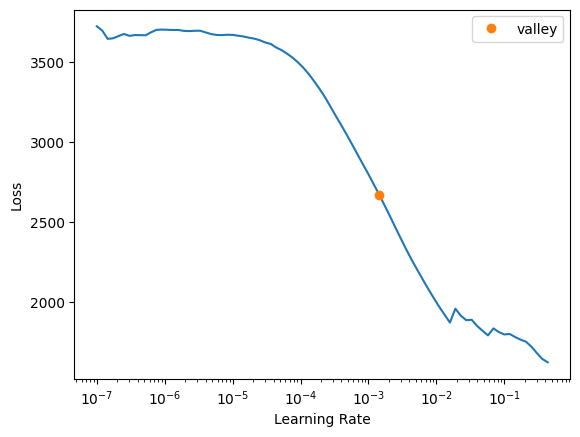

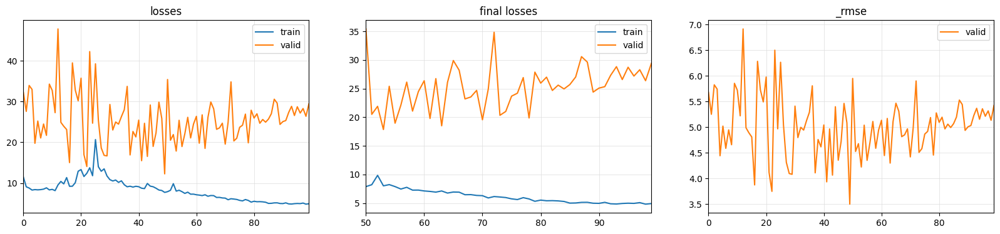

In [24]:
learn = ts_learner(dls, "PatchTST", metrics=[mae, rmse], cbs=ShowGraph())
lr = learn.lr_find()

reg.fit_one_cycle(epochs, lr)
reg.export("reg.pkl")

In [25]:
learn.plot_metrics()

not enough values to plot a chart


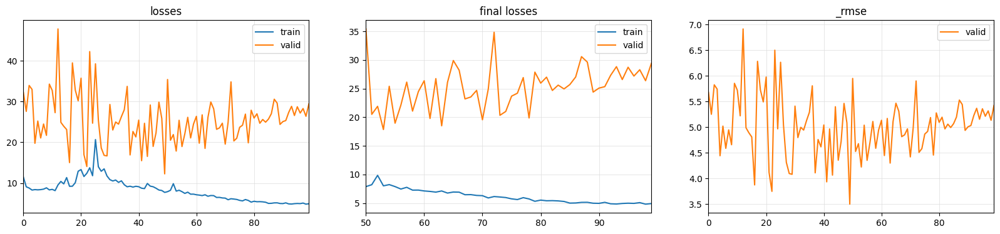

In [26]:
reg.plot_metrics()

In [27]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)
raw_preds, target, preds = learn.get_X_preds(X[splits[1]], y[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [28]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.basics import *

epochs = 100
# lr = 3e-4

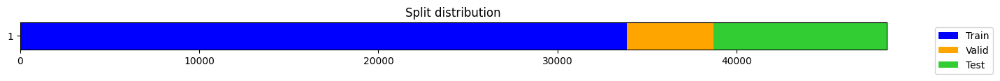

((48384, 49),
 (48384, 1),
 ((#33848) [0,1,2,3,4,5,6,7,8,9...],
  (#4835) [33848,33849,33850,33851,33852,33853,33854,33855,33856,33857...],
  (#9671) [38683,38684,38685,38686,38687,38688,38689,38690,38691,38692...]))

In [29]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 30 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

In [30]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

NameError: name 'TSToPlot' is not defined

Restarted tomato2023 (Python 3.8.10)

In [1]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.all import *

epochs = 100
# lr = 3e-4

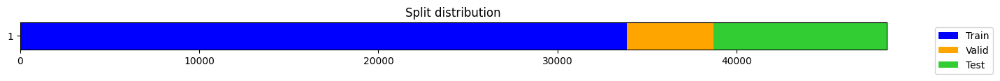

((48384, 49),
 (48384, 1),
 ((#33848) [0,1,2,3,4,5,6,7,8,9...],
  (#4835) [33848,33849,33850,33851,33852,33853,33854,33855,33856,33857...],
  (#9671) [38683,38684,38685,38686,38687,38688,38689,38690,38691,38692...]))

In [2]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 30 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

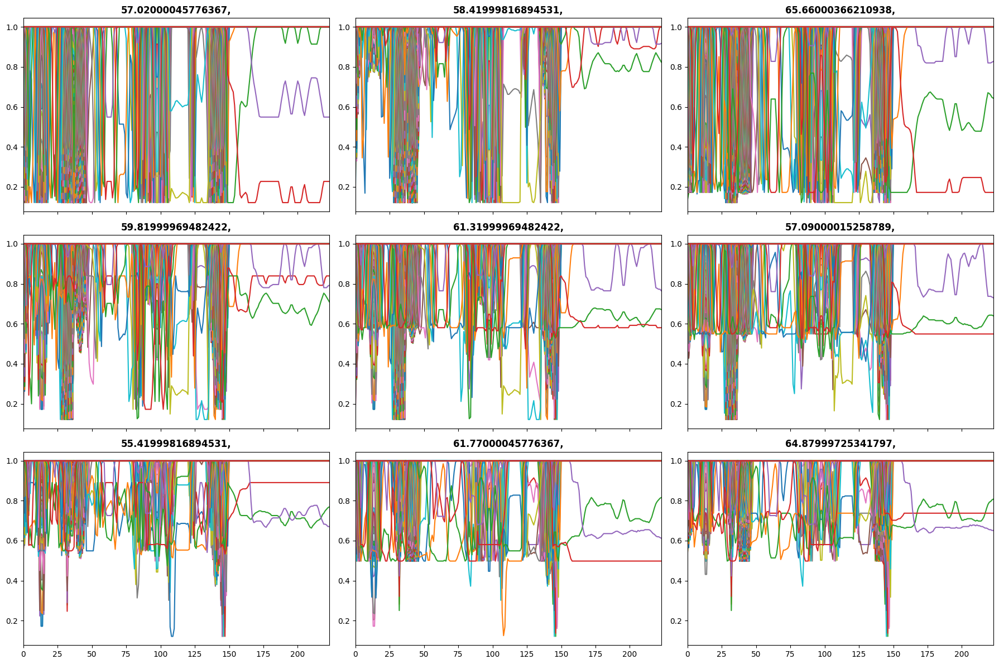

In [3]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

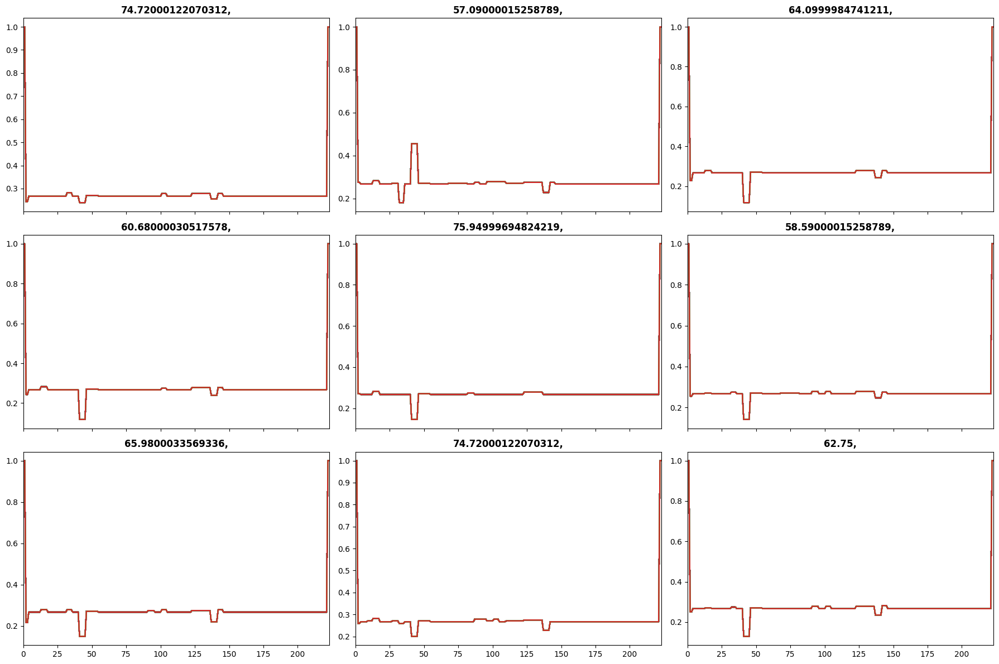

In [4]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

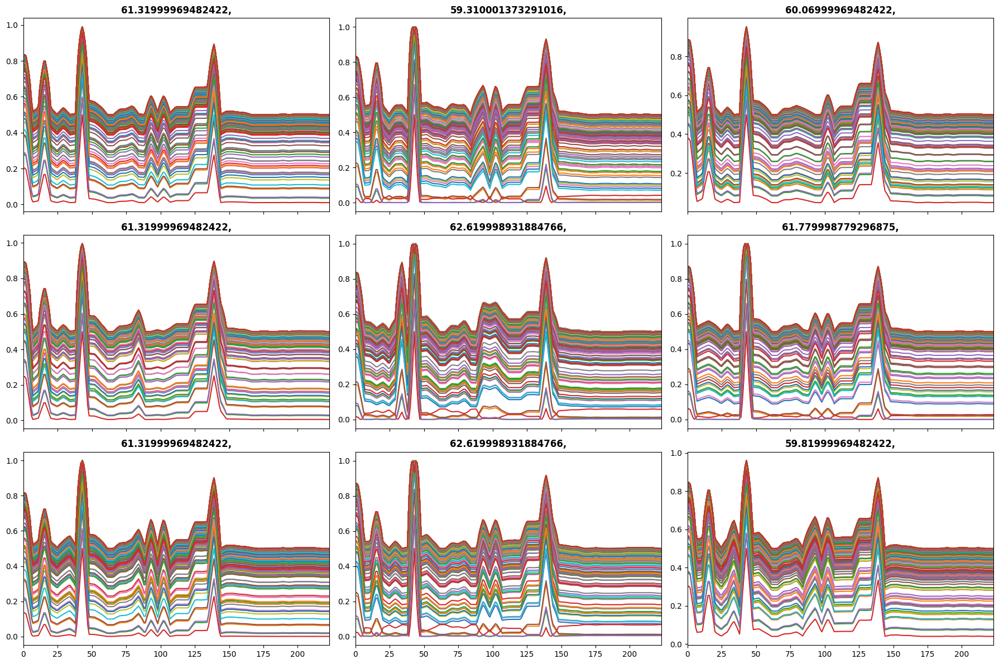

In [5]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [6]:
learn = ts_learner(dls, "PatchTST", metrics=[mae, rmse], cbs=ShowGraph(),
    path="models", tfms=tfms, batch_tfms=batch_tfms)
lr = learn.lr_find()

TypeError: __init__() got an unexpected keyword argument 'tfms'

In [7]:
learn = ts_learner(dls, reg)
lr = learn.lr_find()

NameError: name 'reg' is not defined

In [8]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=torch.Size([224, 224]) pred_dim=1 arch_config={}, kwargs={})


TypeError: unsupported operand type(s) for -: 'torch.Size' and 'int'

In [9]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.all import *

epochs = 100
# lr = 3e-4

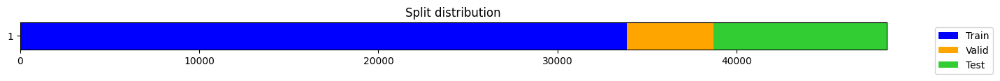

((48384, 49),
 (48384, 1),
 ((#33848) [0,1,2,3,4,5,6,7,8,9...],
  (#4835) [33848,33849,33850,33851,33852,33853,33854,33855,33856,33857...],
  (#9671) [38683,38684,38685,38686,38687,38688,38689,38690,38691,38692...]))

In [10]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["FRT_LNGTH"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 30 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

# X, y, splits = get_regression_data('AppliancesEnergy', split_data=False)
X.shape, y.shape, splits

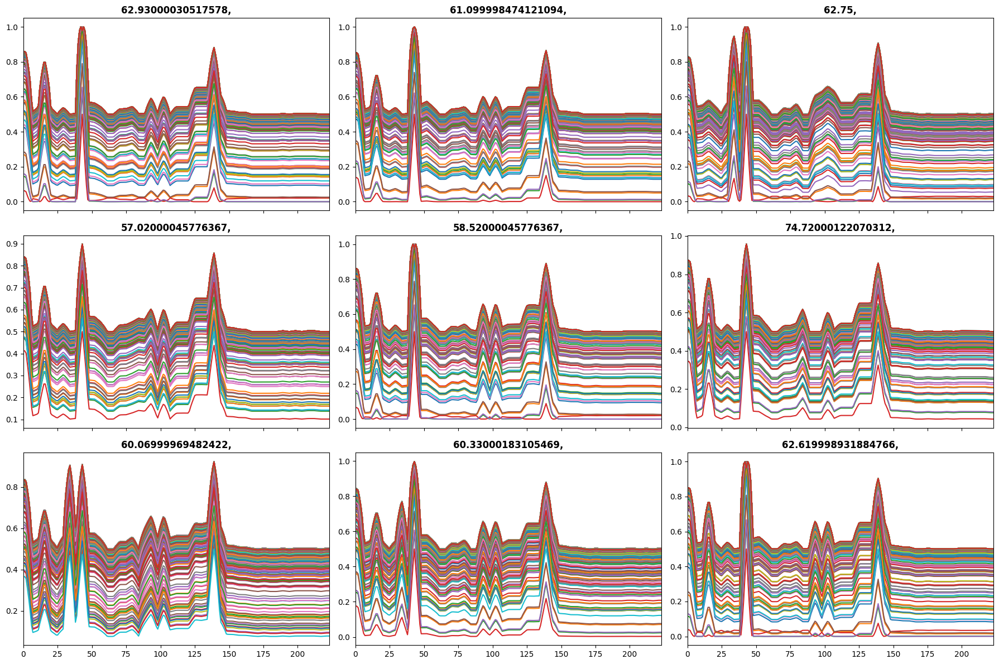

In [11]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [12]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=torch.Size([224, 224]) pred_dim=1 arch_config={}, kwargs={})


TypeError: unsupported operand type(s) for -: 'torch.Size' and 'int'

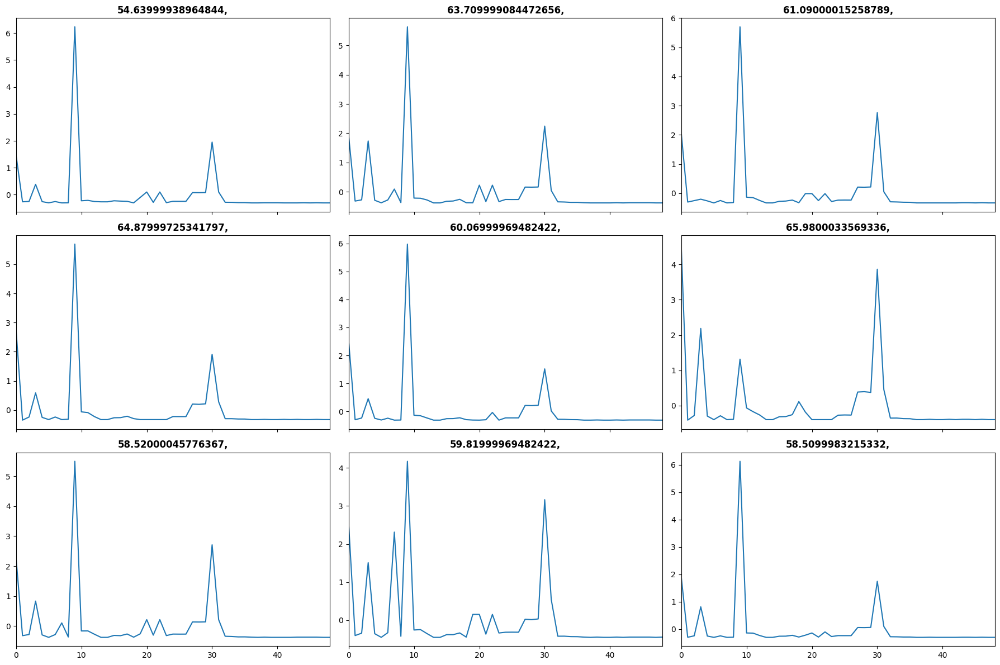

In [13]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [14]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


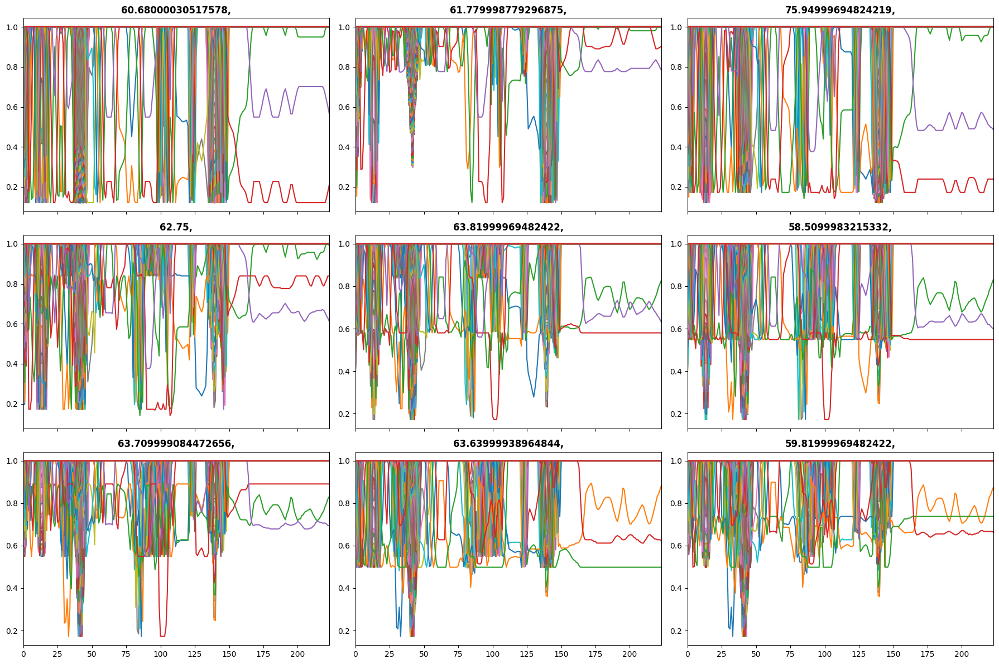

In [15]:
tfms = [None, TSRegression()]
batch_tfms = [
    # TSStandardize(by_sample=True),
    TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [16]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=3 c_out=1 seq_len=torch.Size([224, 224]) pred_dim=1 arch_config={}, kwargs={})


TypeError: unsupported operand type(s) for -: 'torch.Size' and 'int'

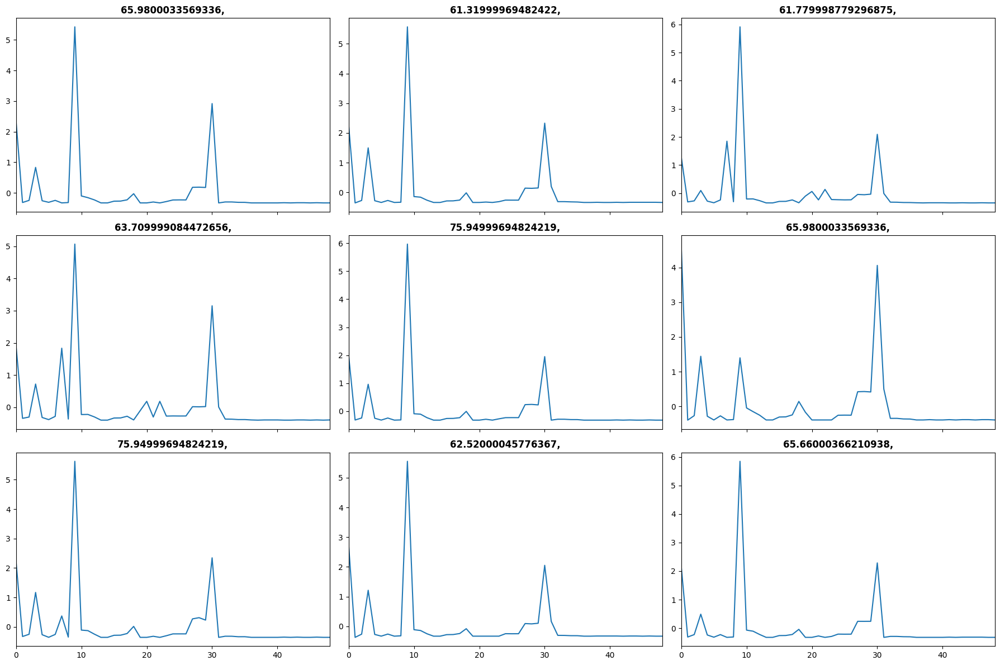

In [17]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

In [18]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


In [19]:
learn = ts_learner(dls, reg)
lr = learn.lr_find()

AttributeError: __name__

In [20]:
learn = ts_learner(dls, reg)
lr = learn.lr_find()

AttributeError: __name__

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


SuggestedLRs(valley=0.0006918309954926372)

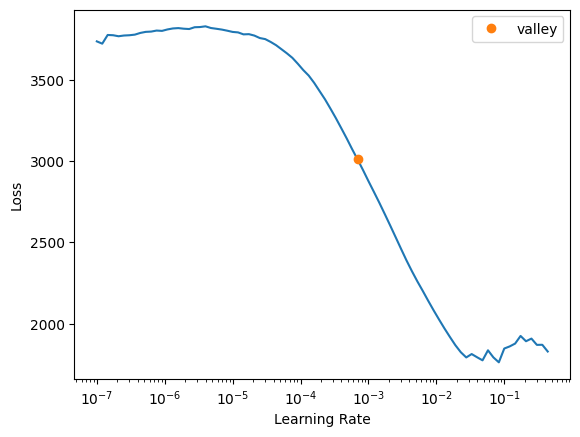

In [21]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
reg.lr_find()

arch: PatchTST(c_in=1 c_out=1 seq_len=49 pred_dim=1 arch_config={}, kwargs={})


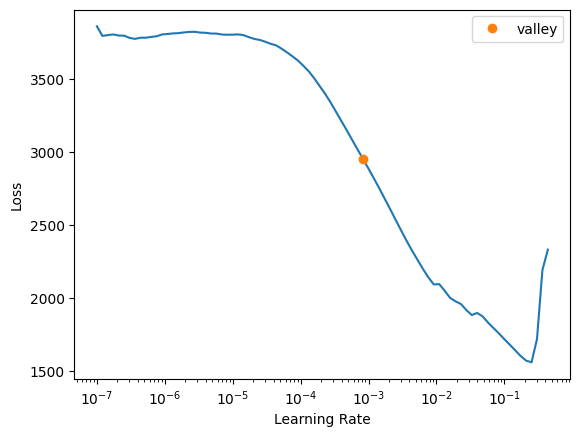

In [22]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
lr = reg.lr_find()

epoch,train_loss,valid_loss,mae,_rmse,time
0,28.001432,41.191414,5.407928,6.418054,00:05
1,9.481140,30.694555,4.505493,5.540267,00:05
2,8.451238,29.733496,4.367176,5.452844,00:05
3,9.059980,42.055882,5.570236,6.485051,00:05
4,8.248625,27.269438,4.271340,5.222015,00:05
5,8.104671,30.298136,4.447296,5.504374,00:05
6,8.174442,38.408989,5.257936,6.197499,00:05


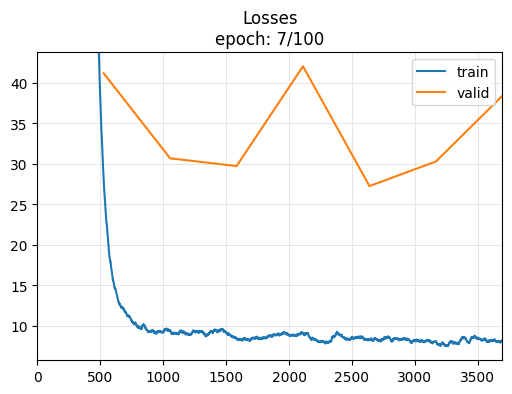

In [23]:
reg.fit_one_cycle(epochs, lr)
reg.export("reg.pkl")

Restarted tomato2023 (Python 3.8.10)

In [1]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns
X_raw = df[X_cols]
y_cols = ["INNER_TPRT_1"] 
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history =  # # steps in the past
fcst_horizon = 12  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

SyntaxError: invalid syntax (<ipython-input-1-c385e0ae30cf>, line 10)

In [2]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.all import *

epochs = 100
# lr = 3e-4

In [3]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = pd.read_csv("control.csv").columns

y_cols = ["INNER_TPRT_1"] 
X_cols.remove(y_cols[0])
X_raw = df[X_cols]
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 60 # # steps in the past
fcst_horizon = 12  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

AttributeError: 'Index' object has no attribute 'remove'

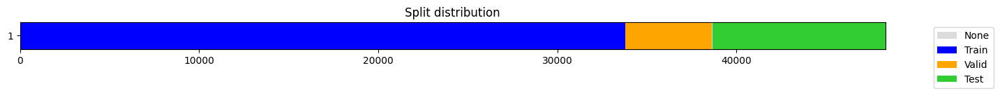

((48384, 48),
 (48384, 1),
 ((#33804) [0,1,2,3,4,5,6,7,8,9...],
  (#4829) [33815,33816,33817,33818,33819,33820,33821,33822,33823,33824...],
  (#9658) [38655,38656,38657,38658,38659,38660,38661,38662,38663,38664...]))

In [4]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = list(pd.read_csv("control.csv").columns)

y_cols = ["INNER_TPRT_1"] 
X_cols.remove(y_cols[0])
X_raw = df[X_cols]
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 60 # # steps in the past
fcst_horizon = 12  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

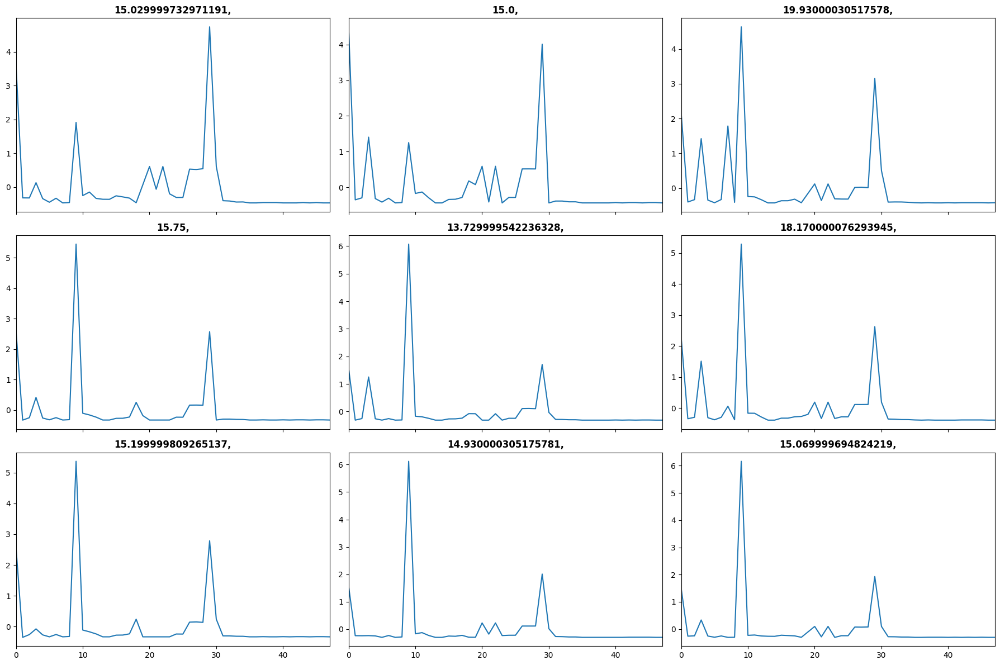

In [5]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

arch: PatchTST(c_in=1 c_out=1 seq_len=48 pred_dim=1 arch_config={}, kwargs={})


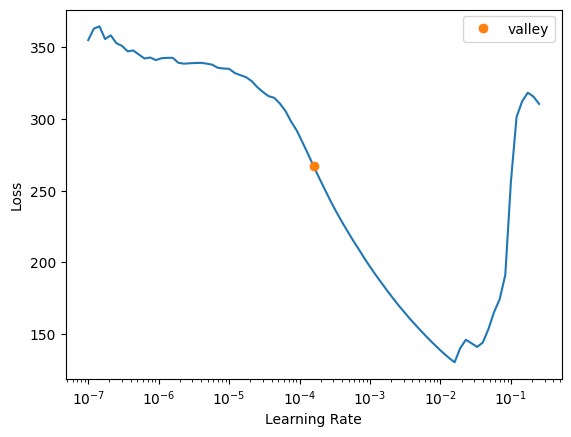

In [6]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
lr = reg.lr_find()

epoch,train_loss,valid_loss,mae,_rmse,time
0,3.635244,5.494672,1.905640,2.344072,00:05
1,2.744312,4.536316,1.679734,2.129863,00:05
2,2.268970,3.801107,1.496446,1.949643,00:05


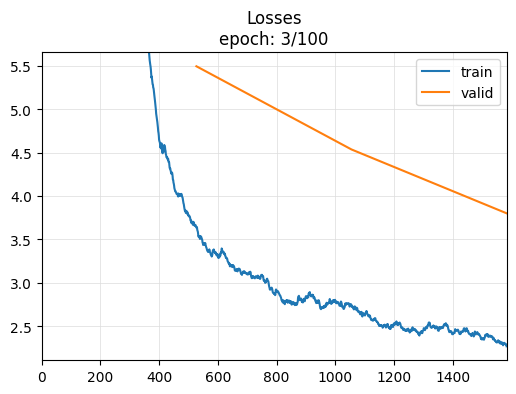

In [7]:
reg.fit_one_cycle(epochs, lr)
reg.export("reg.pkl")

Restarted tomato2023 (Python 3.8.10)

In [1]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.all import *

epochs = 50
# lr = 3e-4

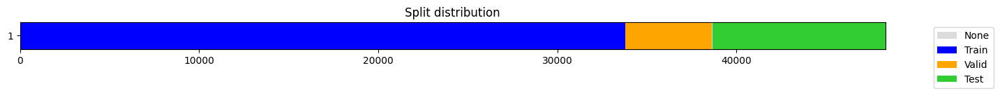

((48384, 48),
 (48384, 1),
 ((#33804) [0,1,2,3,4,5,6,7,8,9...],
  (#4829) [33815,33816,33817,33818,33819,33820,33821,33822,33823,33824...],
  (#9658) [38655,38656,38657,38658,38659,38660,38661,38662,38663,38664...]))

In [2]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = list(pd.read_csv("control.csv").columns)

y_cols = ["INNER_TPRT_1"] 
X_cols.remove(y_cols[0])
X_raw = df[X_cols]
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 60 # # steps in the past
fcst_horizon = 12  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

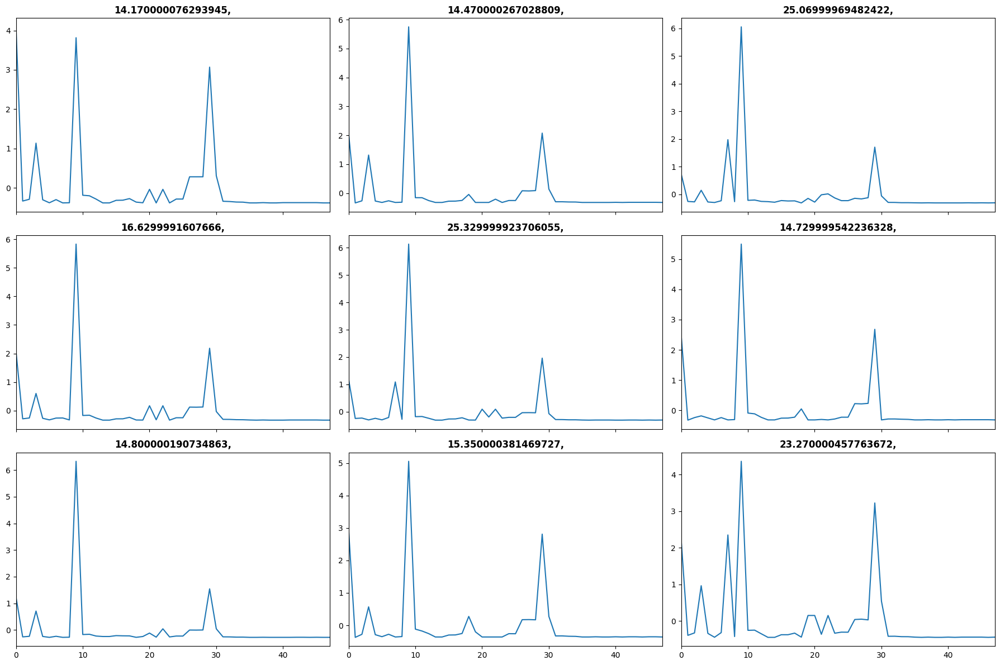

In [3]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
# dls.one_batch()
dls.show_batch()

arch: PatchTST(c_in=1 c_out=1 seq_len=48 pred_dim=1 arch_config={}, kwargs={})


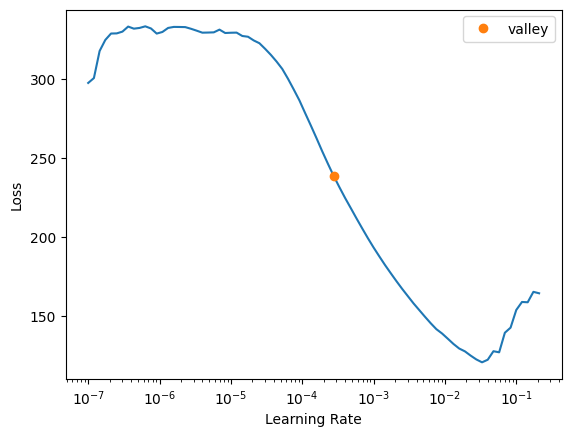

In [4]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
lr = reg.lr_find()

epoch,train_loss,valid_loss,mae,_rmse,time
0,2.954736,5.276857,1.842402,2.297141,00:05
1,2.239817,3.495121,1.451543,1.869524,00:05
2,1.954847,2.558167,1.251595,1.599427,00:05
3,1.617406,3.702276,1.491476,1.924130,00:05
4,1.422997,5.423190,1.882365,2.328774,00:05
5,1.291693,2.425050,1.177005,1.557257,00:05
6,1.190369,1.567704,1.013491,1.252080,00:05
7,1.125645,2.003653,1.037625,1.415505,00:05
8,1.041882,1.518555,0.911634,1.232297,00:05
9,0.838865,1.024043,0.741122,1.011950,00:05


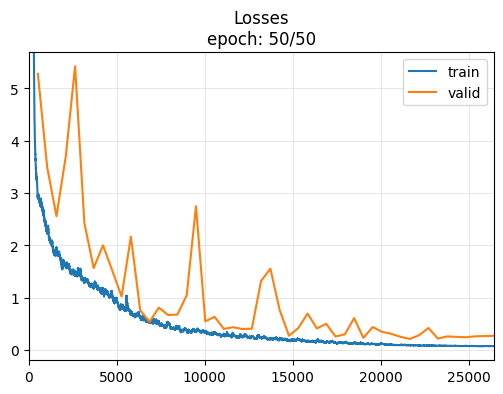

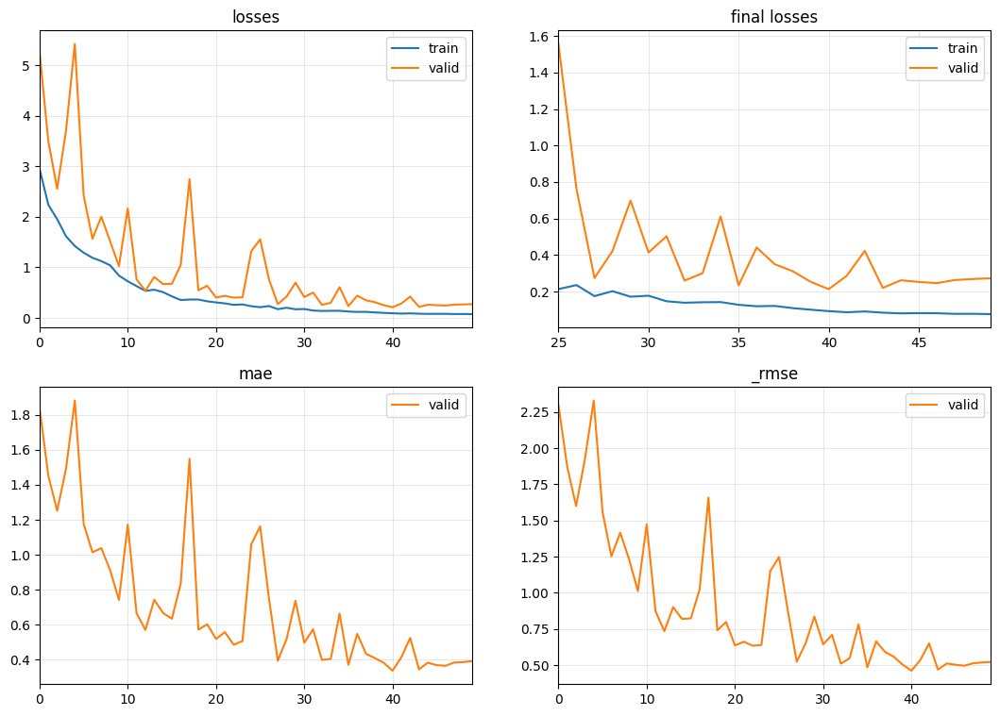

In [5]:
reg.fit_one_cycle(epochs, lr)
reg.export("reg.pkl")

In [6]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)
raw_preds, target, preds = learn.get_X_preds(X[splits[1]], y[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [7]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)
raw_preds, target, preds = learn.get_X_preds(X[splits[1]]) #, y[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [8]:
reg.get_X_preds(X[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [9]:
reg.get_X_preds(X[splits[1]], tfms=tfms)

TypeError: get_X_preds() got an unexpected keyword argument 'tfms'

In [10]:
reg.get_X_preds(X[splits[1]], batch_tfms=batch_tfms)

TypeError: get_X_preds() got an unexpected keyword argument 'batch_tfms'

In [11]:
reg.get_X_preds(X[splits[1]], bs=1)

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [12]:
reg.get_X_preds(X[splits[1]], bs=64)

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [13]:
reg.get_X_preds(X[splits[1]], bs=128)

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [14]:
X[splits[1]].shape()

TypeError: 'tuple' object is not callable

In [15]:
X[splits[1]].shape

(4829, 48)

In [16]:
reg.bs

AttributeError: 'PatchTST' object has no attribute 'bs'

In [17]:
reg.batch_size

AttributeError: 'PatchTST' object has no attribute 'batch_size'

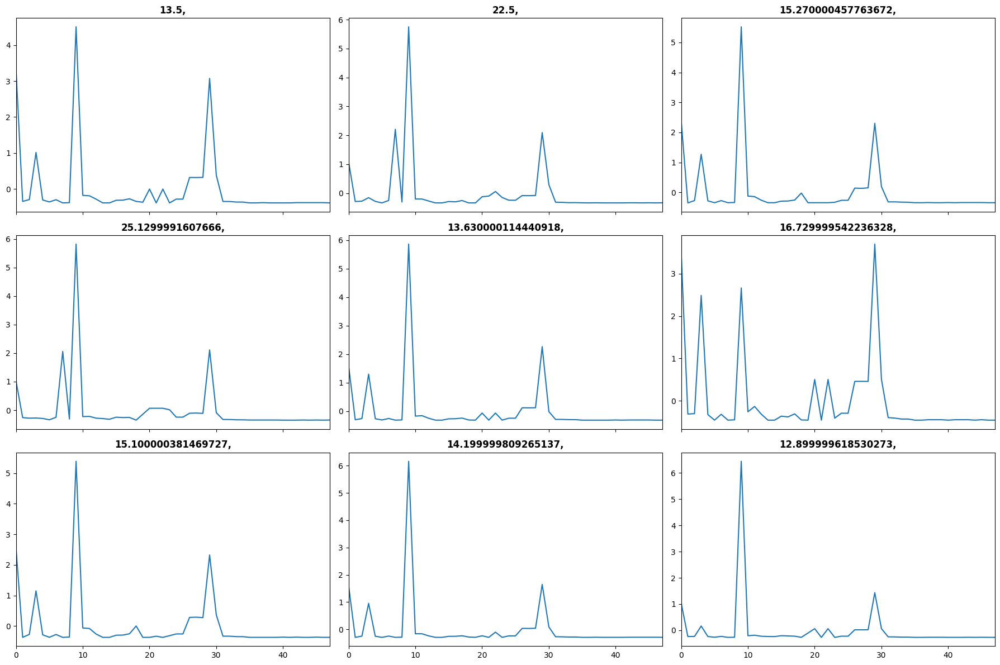

In [18]:
dls.one_batch()
dls.show_batch()

In [19]:
dls.one_batch()
# dls.show_batch()

(TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32),
 tensor([[25.3300],
         [16.0500],
         [22.1700],
         [14.7000],
         [21.5700],
         [14.0000],
         [16.5000],
         [17.5700],
         [26.2300],
         [19.7000],
         [13.7000],
         [16.6500],
         [13.3000],
         [18.8700],
         [21.0700],
         [13.9000],
         [14.6700],
         [13.2700],
         [22.9000],
         [13.6700],
         [15.2700],
         [16.8300],
         [16.8300],
         [18.9000],
         [14.8300],
         [23.9700],
         [15.0300],
         [26.9300],
         [28.4300],
         [17.7700],
         [15.8700],
         [13.6000],
         [14.4000],
         [12.9000],
         [17.3700],
         [13.8300],
         [16.3700],
         [14.1300],
         [21.2000],
         [17.9700],
         [22.3000],
         [16.5300],
         [29.3700],
         [16.6300],
         [15.0700],
         [16.1700],
     

In [20]:
dls.one_batch().shape
# dls.show_batch()

AttributeError: 'tuple' object has no attribute 'shape'

In [21]:
dls.one_batch()
# dls.show_batch()

(TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32),
 tensor([[15.1300],
         [16.8000],
         [16.1000],
         [14.9000],
         [20.4000],
         [15.3700],
         [18.0300],
         [13.9300],
         [14.8300],
         [25.5700],
         [21.6000],
         [15.7300],
         [19.2700],
         [13.8000],
         [16.9700],
         [13.9000],
         [14.4300],
         [14.6000],
         [21.3700],
         [14.8000],
         [14.0300],
         [28.3700],
         [17.5300],
         [14.2300],
         [21.0700],
         [21.9300],
         [14.4300],
         [20.7500],
         [18.3300],
         [16.5000],
         [18.6700],
         [15.4700],
         [15.8500],
         [18.6300],
         [19.3000],
         [18.8700],
         [13.7700],
         [20.2000],
         [17.8300],
         [21.8700],
         [15.3700],
         [16.0300],
         [17.2000],
         [28.2300],
         [19.1300],
         [19.9000],
     

In [22]:
dls.one_batch()[0]
# dls.show_batch()

TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32)

TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32)


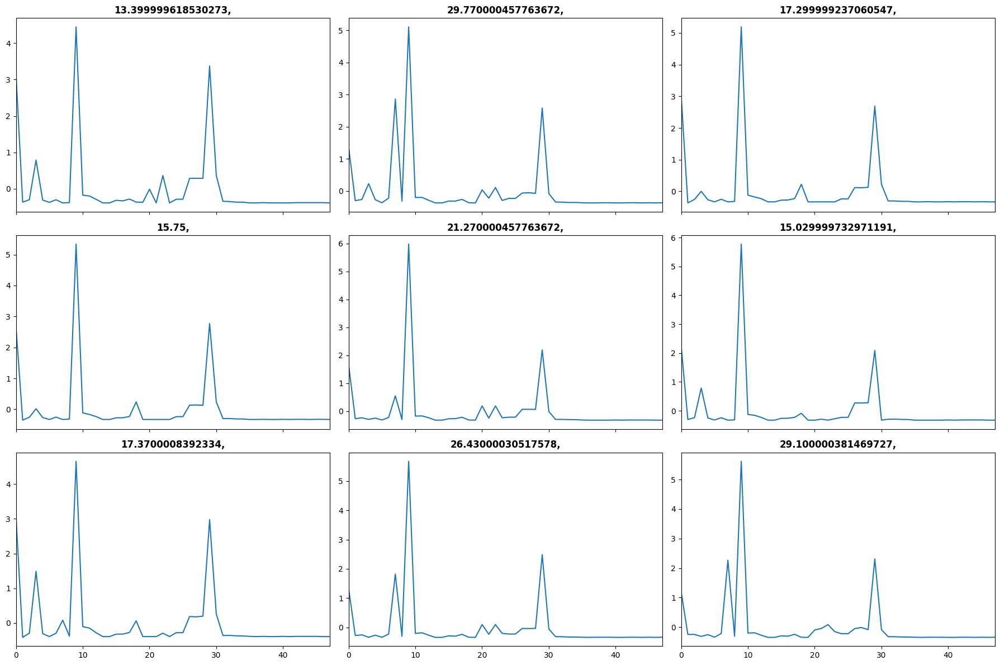

In [23]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
    
print(dls.one_batch()[0])
dls.show_batch()

In [24]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(X[splits[1]],) #, y[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [25]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(X[splits[1]], y[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [26]:
X[splits[1]].shape

(4829, 48)

In [27]:
X[splits[1]].view(64, 48, -1)

TypeError: view() takes from 0 to 2 positional arguments but 3 were given

In [28]:
X[splits[1]].reshape(64, 48, -1)

ValueError: cannot reshape array of size 231792 into shape (64,48,newaxis)

In [29]:
X[splits[1]].reshape(-1, 48, 72)

ValueError: cannot reshape array of size 231792 into shape (48,72)

In [30]:
X[splits[1]].reshape(-1, 48, 60)

ValueError: cannot reshape array of size 231792 into shape (48,60)

In [31]:
X[splits[1]].reshape(-1, 48, 12)

ValueError: cannot reshape array of size 231792 into shape (48,12)

In [32]:
X[splits[1]].reshape(64, -1, -1)

ValueError: can only specify one unknown dimension

In [33]:
X[splits[1]].reshape(-1)

array([317.67,  14.37,  16.8 , ...,   1.  ,   0.  ,   0.  ])

In [34]:
X[splits[1]].reshape(48, -1, -1)

ValueError: can only specify one unknown dimension

In [35]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]], y[splits[2]]
)

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [36]:
X[splits[2]].reshape(64, 48, -1)

ValueError: cannot reshape array of size 463584 into shape (64,48,newaxis)

In [37]:
X[splits[2]].reshape(1, 48, -1)

array([[[4.35670e+02, 1.58300e+01, 1.58700e+01, ..., 0.00000e+00,
         9.00000e-01, 1.23633e+03],
        [2.08700e+01, 2.28000e+01, 1.25700e+01, ..., 2.16700e+01,
         0.00000e+00, 5.00000e+01],
        [1.00000e+02, 0.00000e+00, 1.00000e+02, ..., 9.79000e+01,
         9.88000e+01, 4.50000e+02],
        ...,
        [0.00000e+00, 5.00000e+01, 2.00000e+01, ..., 2.24400e+01,
         7.82000e+01, 7.14000e+01],
        [8.50000e+01, 3.86670e+02, 1.10000e+02, ..., 0.00000e+00,
         0.00000e+00, 1.00000e+00],
        [1.00000e+00, 1.00000e+00, 0.00000e+00, ..., 1.00000e+00,
         0.00000e+00, 0.00000e+00]]])

In [38]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, 48, -1)
)

RuntimeError: The size of tensor a (1207) must match the size of tensor b (6) at non-singleton dimension 1

In [39]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(12, 48, -1)
)

ValueError: cannot reshape array of size 463584 into shape (12,48,newaxis)

In [40]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, 48, -1)
)

RuntimeError: The size of tensor a (1207) must match the size of tensor b (6) at non-singleton dimension 1

In [41]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(6, 48, -1)
)

ValueError: cannot reshape array of size 463584 into shape (6,48,newaxis)

In [42]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(60, 48, -1)
)

ValueError: cannot reshape array of size 463584 into shape (60,48,newaxis)

In [43]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(128, 48, -1)
)

ValueError: cannot reshape array of size 463584 into shape (128,48,newaxis)

In [44]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, 48, -1)
)

RuntimeError: The size of tensor a (1207) must match the size of tensor b (6) at non-singleton dimension 1

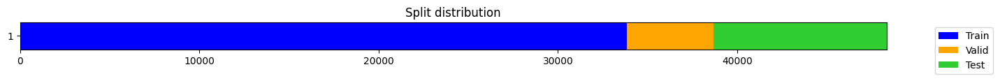

((48384, 48),
 (48384, 1),
 ((#33827) [0,1,2,3,4,5,6,7,8,9...],
  (#4832) [33827,33828,33829,33830,33831,33832,33833,33834,33835,33836...],
  (#9665) [38659,38660,38661,38662,38663,38664,38665,38666,38667,38668...]))

In [45]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = list(pd.read_csv("control.csv").columns)

y_cols = ["INNER_TPRT_1"] 
X_cols.remove(y_cols[0])
X_raw = df[X_cols]
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 60 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32)


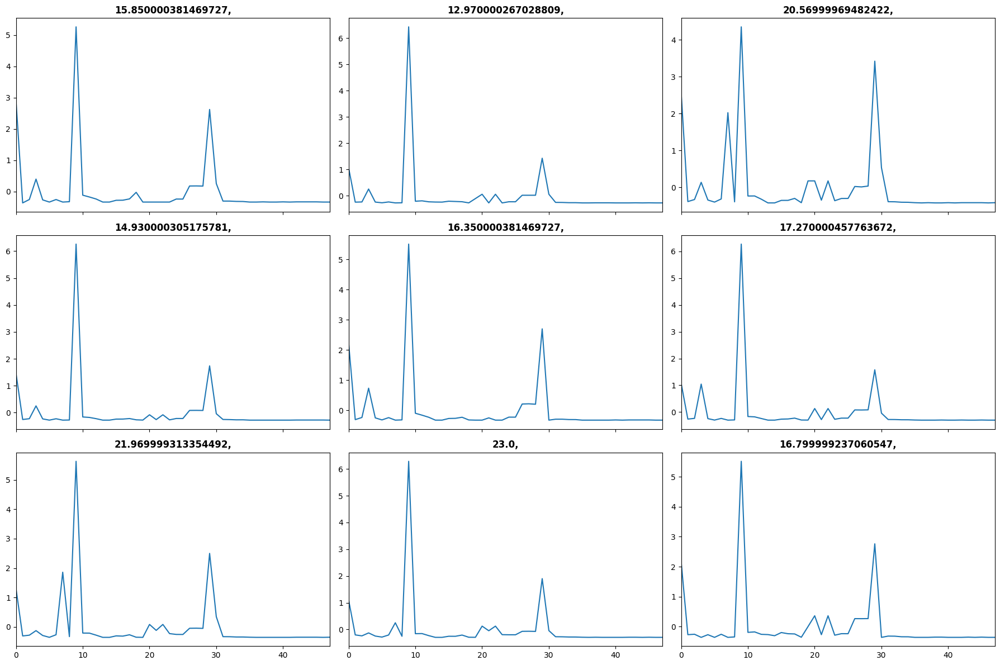

In [46]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
    
print(dls.one_batch()[0])
dls.show_batch()

arch: PatchTST(c_in=1 c_out=1 seq_len=48 pred_dim=1 arch_config={}, kwargs={})


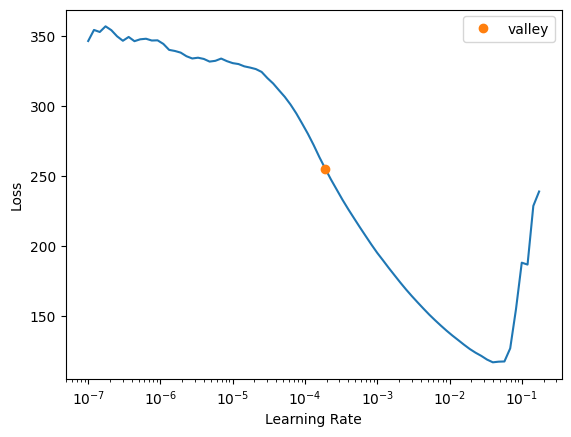

In [47]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
lr = reg.lr_find()

In [48]:
import pandas as pd
from sklearn.datasets import load_linnerud
from tsai.all import *

epochs = 10
# lr = 3e-4

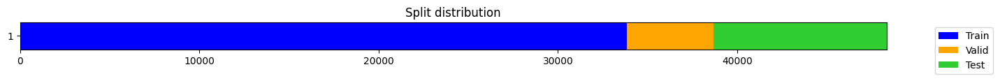

((48384, 48),
 (48384, 1),
 ((#33827) [0,1,2,3,4,5,6,7,8,9...],
  (#4832) [33827,33828,33829,33830,33831,33832,33833,33834,33835,33836...],
  (#9665) [38659,38660,38661,38662,38663,38664,38665,38666,38667,38668...]))

In [49]:
# Load the data
df = pd.read_csv("merged.csv")
X_cols = list(pd.read_csv("control.csv").columns)

y_cols = ["INNER_TPRT_1"] 
X_cols.remove(y_cols[0])
X_raw = df[X_cols]
X, y = df[X_cols].to_numpy(), df[y_cols].to_numpy()

datetime_col = "MSRM_DT"
fcst_history = 60 # # steps in the past
fcst_horizon = 1  # # steps in the future
valid_size   = 0.1  # int or float indicating the size of the training set
test_size    = 0.2  # int or float indicating the size of the test set

splits = get_forecasting_splits(
    df, fcst_history=fcst_history, 
    fcst_horizon=fcst_horizon, datetime_col=datetime_col,
    valid_size=valid_size, test_size=test_size
)

X.shape, y.shape, splits

TSTensor(samples:64, vars:1, len:48, device=cuda:0, dtype=torch.float32)


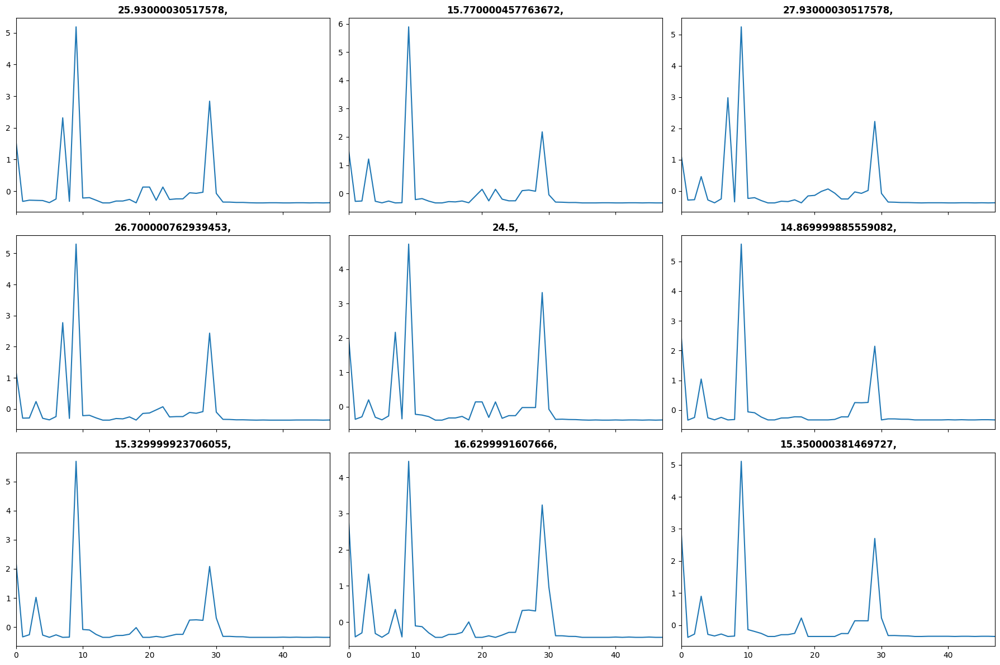

In [50]:
tfms = [None, TSRegression()]
batch_tfms = [
    TSStandardize(by_sample=True),
    # TSNormalize(), TSToPlot(),
    # TSNormalize(), TSToMat(),
    # TSNormalize(), TSToGADF()
]
dls = get_ts_dls(X, y, splits=splits, tfms=tfms, 
    batch_tfms=batch_tfms)
    
print(dls.one_batch()[0])
dls.show_batch()

arch: PatchTST(c_in=1 c_out=1 seq_len=48 pred_dim=1 arch_config={}, kwargs={})


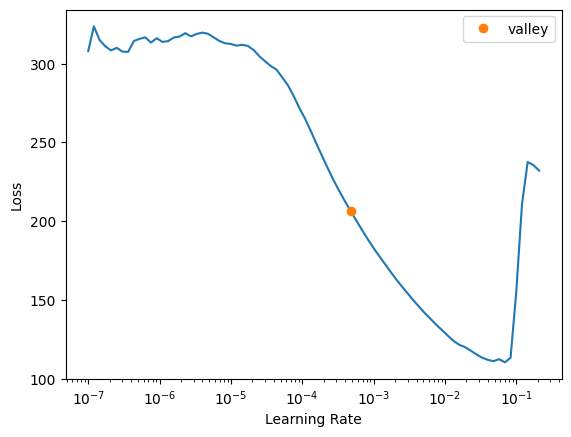

In [51]:
reg = TSRegressor(
    X, y, splits=splits, 
    path='models', arch="PatchTST", 
    tfms=tfms, batch_tfms=batch_tfms, 
    metrics=[mae, rmse], cbs=ShowGraph(), verbose=True
)
lr = reg.lr_find()

epoch,train_loss,valid_loss,mae,_rmse,time
0,2.518198,3.644572,1.458107,1.909076,00:05
1,1.931534,2.547487,1.279305,1.596085,00:05
2,1.566663,4.371904,1.641577,2.090910,00:05
3,1.227311,8.218979,2.549846,2.866876,00:05
4,0.898116,1.753383,1.029723,1.324154,00:05
5,0.629772,1.686229,1.041090,1.298549,00:05
6,0.480053,0.900467,0.705678,0.948929,00:05
7,0.359440,0.593551,0.599269,0.770423,00:05
8,0.300152,0.635931,0.612327,0.797453,00:05
9,0.290241,0.556379,0.582871,0.745908,00:05


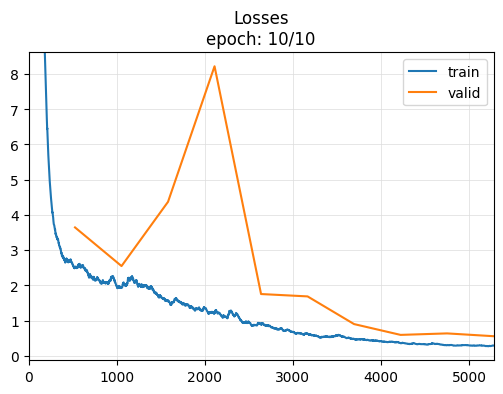

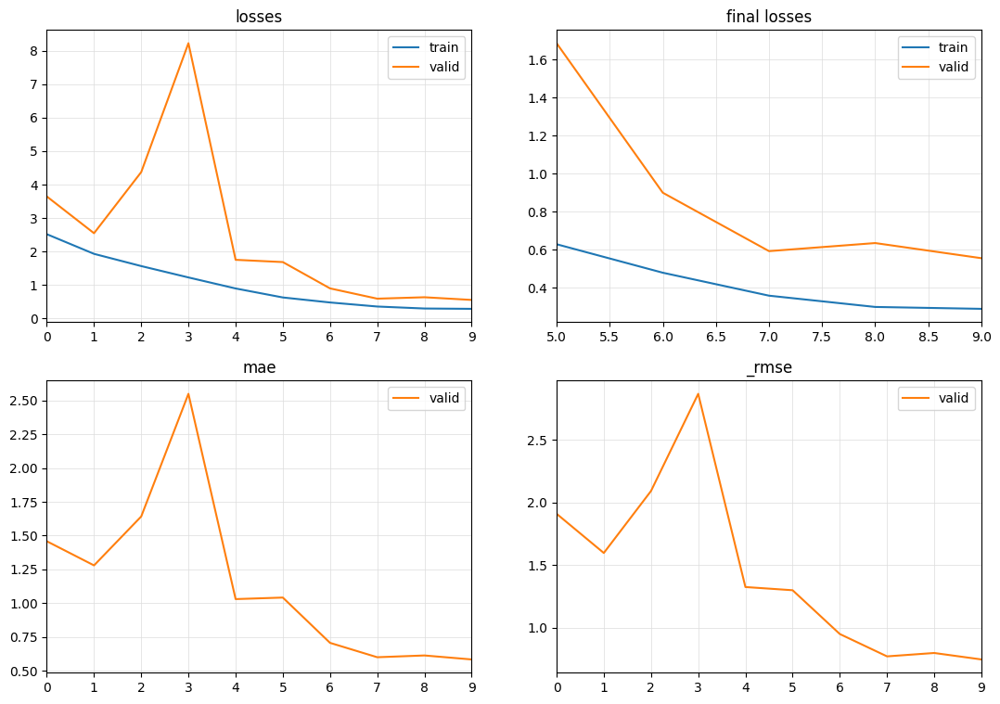

In [52]:
reg.fit_one_cycle(epochs, lr)
reg.export("reg.pkl")

In [53]:
reg.get_X_preds(X[splits[1]])

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [54]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, 48, -1)
)

RuntimeError: The size of tensor a (1208) must match the size of tensor b (6) at non-singleton dimension 1

In [55]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(64, -1, 48)
)

ValueError: cannot reshape array of size 463920 into shape (64,newaxis,48)

In [56]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(-1, 48)
)

AssertionError: You must pass an X iterable with 3 dimensions [batch_size x n_vars x seq_len]

In [57]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

In [58]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

targets, preds

NameError: name 'targets' is not defined

In [59]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

target, preds

(None,
 ([[10.503129005432129],
   [10.520151138305664],
   [10.570821762084961],
   [10.613852500915527],
   [10.972023963928223],
   [11.040043830871582],
   [11.151888847351074],
   [11.257074356079102],
   [11.276060104370117],
   [11.44472885131836],
   [11.608664512634277],
   [11.721565246582031],
   [11.804686546325684],
   [11.838489532470703],
   [11.920242309570312],
   [11.553107261657715],
   [11.580754280090332],
   [11.6292142868042],
   [11.63473892211914],
   [11.45512866973877],
   [11.538941383361816],
   [11.522613525390625],
   [11.557971000671387],
   [11.562681198120117],
   [11.558426856994629],
   [11.540319442749023],
   [11.558877944946289],
   [11.540334701538086],
   [11.621363639831543],
   [11.67502212524414],
   [11.699931144714355],
   [11.756065368652344],
   [11.813457489013672],
   [11.854413032531738],
   [11.883723258972168],
   [11.934624671936035],
   [12.03563117980957],
   [12.606040000915527],
   [12.659377098083496],
   [12.673306465148926],


ValueError: x, y, and format string must not be None

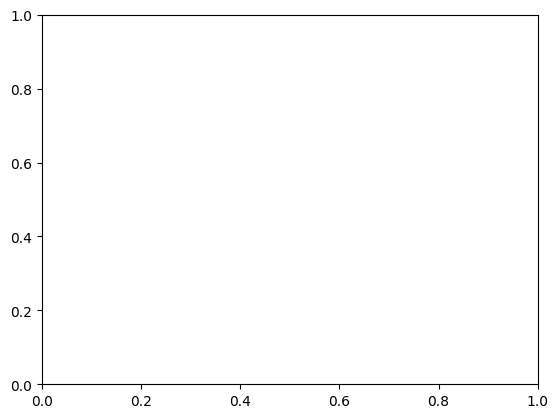

In [60]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

plt.plot(target, preds)

ValueError: x, y, and format string must not be None

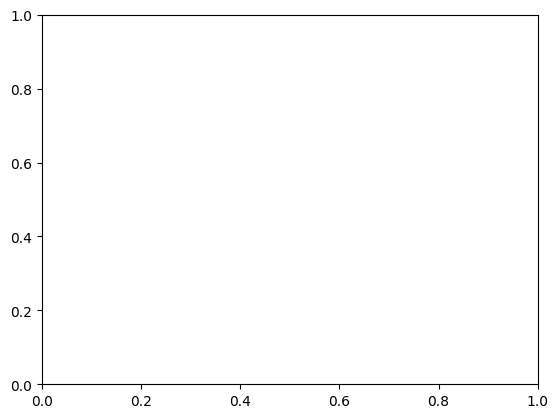

In [61]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, target, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

plt.plot(target)
plt.plot(preds)

In [62]:
target.shape

AttributeError: 'NoneType' object has no attribute 'shape'

In [63]:
target.shape()

AttributeError: 'NoneType' object has no attribute 'shape'

In [64]:
raw_preds.shape()

TypeError: 'torch.Size' object is not callable

In [65]:
raw_preds.shape

torch.Size([1, 9665, 1])

ValueError: x and y can be no greater than 2D, but have shapes (1,) and torch.Size([1, 9665, 1])

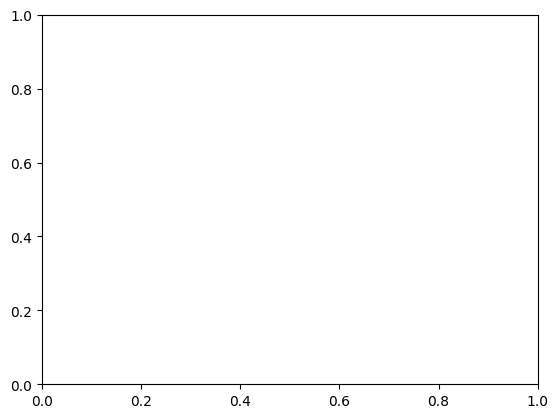

In [66]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, _, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

plt.plot(raw_preds)
plt.plot(preds)

In [67]:
raw_preds.shape

torch.Size([1, 9665, 1])

In [68]:
preds.shape

AttributeError: 'TitledTuple' object has no attribute 'shape'

In [69]:
preds

([[10.503129005432129],
  [10.520151138305664],
  [10.570821762084961],
  [10.613852500915527],
  [10.972023963928223],
  [11.040043830871582],
  [11.151888847351074],
  [11.257074356079102],
  [11.276060104370117],
  [11.44472885131836],
  [11.608664512634277],
  [11.721565246582031],
  [11.804686546325684],
  [11.838489532470703],
  [11.920242309570312],
  [11.553107261657715],
  [11.580754280090332],
  [11.6292142868042],
  [11.63473892211914],
  [11.45512866973877],
  [11.538941383361816],
  [11.522613525390625],
  [11.557971000671387],
  [11.562681198120117],
  [11.558426856994629],
  [11.540319442749023],
  [11.558877944946289],
  [11.540334701538086],
  [11.621363639831543],
  [11.67502212524414],
  [11.699931144714355],
  [11.756065368652344],
  [11.813457489013672],
  [11.854413032531738],
  [11.883723258972168],
  [11.934624671936035],
  [12.03563117980957],
  [12.606040000915527],
  [12.659377098083496],
  [12.673306465148926],
  [12.600446701049805],
  [12.652303695678711],

In [70]:
preds[0]

[[10.503129005432129],
 [10.520151138305664],
 [10.570821762084961],
 [10.613852500915527],
 [10.972023963928223],
 [11.040043830871582],
 [11.151888847351074],
 [11.257074356079102],
 [11.276060104370117],
 [11.44472885131836],
 [11.608664512634277],
 [11.721565246582031],
 [11.804686546325684],
 [11.838489532470703],
 [11.920242309570312],
 [11.553107261657715],
 [11.580754280090332],
 [11.6292142868042],
 [11.63473892211914],
 [11.45512866973877],
 [11.538941383361816],
 [11.522613525390625],
 [11.557971000671387],
 [11.562681198120117],
 [11.558426856994629],
 [11.540319442749023],
 [11.558877944946289],
 [11.540334701538086],
 [11.621363639831543],
 [11.67502212524414],
 [11.699931144714355],
 [11.756065368652344],
 [11.813457489013672],
 [11.854413032531738],
 [11.883723258972168],
 [11.934624671936035],
 [12.03563117980957],
 [12.606040000915527],
 [12.659377098083496],
 [12.673306465148926],
 [12.600446701049805],
 [12.652303695678711],
 [12.748769760131836],
 [13.3771667480468

In [71]:
preds[1]

IndexError: tuple index out of range

ValueError: x and y can be no greater than 2D, but have shapes (1,) and torch.Size([1, 9665, 1])

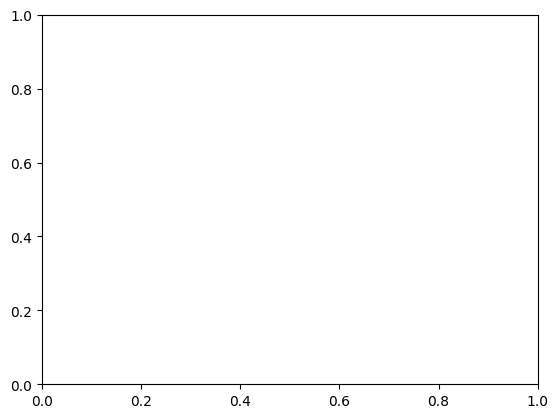

In [72]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, _, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

plt.plot(raw_preds)
plt.plot(preds[0])

In [73]:
preds[0].shape()

AttributeError: 'list' object has no attribute 'shape'

In [74]:
len(preds[0].shape)

AttributeError: 'list' object has no attribute 'shape'

In [75]:
len(preds[0])

9665

In [76]:
raw_preds.shape

torch.Size([1, 9665, 1])

In [77]:
raw.preds.reshape(-1)

NameError: name 'raw' is not defined

In [78]:
raw_preds.reshape(-1)

tensor([10.5031, 10.5202, 10.5708,  ..., 24.5477, 24.4019, 24.2975])

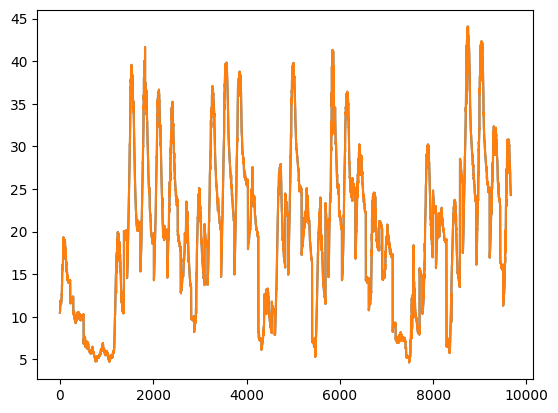

In [79]:
from tsai.inference import load_learner

learn = load_learner("models/reg.pkl", cpu=False)

raw_preds, _, preds = learn.get_X_preds(
    X[splits[2]].reshape(1, -1, 48)
)

plt.plot(raw_preds.reshape(-1))
plt.plot(preds[0])